# Tourist Housing - Barcelona

## Initial Module Imports and File Loads
In this section, we load in various python modules and load in our data files. 

### Import python modules

These modules will help us create graphics and work with dataframes and geodataframes. 

In [1]:
# Import geopandas
import geopandas as gpd

# and regular pandas
import pandas as pd

# to provide basemaps 
import contextily as ctx

# to give more power to your figures (plots)
import matplotlib.pyplot as plt

# for interactive maps
import plotly.express as px

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

/opt/conda/lib/python3.8/site-packages/geopandas/_compat.py:106: UserWarning: The Shapely GEOS version (3.8.1-CAPI-1.13.3) is incompatible with the GEOS version PyGEOS was compiled with (3.9.0-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(


In [2]:
# Load in barri geojson file 
bb = gpd.read_file('Data/shapefiles_barrio_barcelona.geojson')

In [3]:
# Load in data files
ab_16 = gpd.read_file('Data/AirBNB_2016.csv')
ab_17 = gpd.read_file('Data/AirBNB_2017.csv')
ab_18 = gpd.read_file('Data/AirBNB_2018.csv')
ab_19 = gpd.read_file('Data/AirBNB_2019.csv')

In [4]:
# Load in overall housing csv file
housing = gpd.read_file('Data/2010_2019_TotalHousing_Barri.csv')

## Data Clean Up

### Clean up data file #1: barri spatial data

We've worked with this dataframe before. It needs to be trimmed to only include the columns: c_barri, n_barri, and geometry.  

In [5]:
# Trim the dataframe so that we just have the number of the neighborhood, name of the neighborhood (for backchecking),
# and the geometry. Print the first 5 rows to test. 

bb_tr = bb[['c_barri','n_barri','geometry']]
bb_tr.head()

,c_barri,n_barri,geometry
0,22,"Vallvidrera, el Tibidabo i les Planes","MULTIPOLYGON (((2.07327 41.41383, 2.07165 41.4..."
1,23,SarriÃ,"MULTIPOLYGON (((2.12062 41.41357, 2.12065 41.4..."
2,25,Sant Gervasi - la Bonanova,"MULTIPOLYGON (((2.13042 41.42065, 2.13049 41.4..."
3,43,Horta,"MULTIPOLYGON (((2.16268 41.44105, 2.16273 41.4..."
4,12,la Marina del Prat Vermell,"MULTIPOLYGON (((2.17878 41.37342, 2.17860 41.3..."


### Clean up data file #2-5: Airbnb data

We'll want to trim this data to just get geocoordinates, id, room_type, and geometry. 

In [6]:
#Check the first five rows
ab_16.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,geometry
0,8665980,Lancaster suit,8940900,,Ciutat Vella,el Raval,41.3769810753873,2.17476275412851,Entire home/apt,100,100,4,2015-11-01,1.32,1,363,None
1,732616,Big apartment near Plaza Catalunya,2967830,Mr. Dani P.R.,Ciutat Vella,el Raval,41.38470975871140,2.165463716864520,Entire home/apt,175,3,12,2015-09-18,0.37,4,357,None
2,8894189,Big Room Best Location of Barcelona,6981341,Leonardo Miguel,Ciutat Vella,el Raval,41.38413586046680,2.1704485171840100,Private room,30,2,1,2015-11-16,0.61,1,215,None
3,2284413,Ramblas for Comfort 2A,9786902,Penélope,Ciutat Vella,el Raval,41.38016668386920,2.1734034378966000,Entire home/apt,95,2,43,2015-12-16,2.03,4,54,None
4,2411575,Cozy sunny apt. in the heart of BCN,4193907,Julia,Ciutat Vella,el Raval,41.382677044049900,2.166005329657390,Private room,40,2,54,2015-12-31,2.57,2,324,None


In [7]:
#Check the last five rows
ab_16.tail()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,geometry
14850,9861758,VIP Suite in Luxury Yacht Barcelona,48891239,Paco,Sant Martí,la Vila Olímpica del Poblenou,41.38609715348560,2.1994907045903800,Private room,225,2,0,,,2,90,None
14851,9933466,New & private room in a bright flat,49886938,Alberto,Sants-Montjuïc,Sants - Badal,41.37475192930420,2.1232975558636100,Private room,20,1,0,,,1,365,None
14852,10332204,Holidays with new experience!,21778645,Alex,Sant Martí,la Vila Olímpica del Poblenou,41.386938392513200,2.201300694885750,Entire home/apt,42,1,0,,,1,365,None
14853,9806352,mireia,15052431,Pilar,Sant Martí,el Besòs i el Maresme,41.41448413658630,2.221700991419230,Private room,20,1,0,,,3,365,None
14854,10303473,Nice room in Collblanc (270€/month),31839745,Anna,Les Corts,la Maternitat i Sant Ramon,41.37605678916290,2.1195948748405500,Private room,15,1,0,,,1,365,None


In [8]:
#Check how many rows of data we have
ab_16.shape

(14855, 17)

In [9]:
#Convert lat and long columns into geometry column
ab_16 = gpd.GeoDataFrame(
    ab_16, geometry=gpd.points_from_xy(ab_16.longitude, ab_16.latitude))
ab_17 = gpd.GeoDataFrame(
    ab_17, geometry=gpd.points_from_xy(ab_17.longitude, ab_17.latitude))
ab_18 = gpd.GeoDataFrame(
    ab_18, geometry=gpd.points_from_xy(ab_18.longitude, ab_18.latitude))
ab_19 = gpd.GeoDataFrame(
    ab_19, geometry=gpd.points_from_xy(ab_19.longitude, ab_19.latitude))

In [10]:
#Trim dataframes
columns_to_keep = ['id','neighbourhood','room_type','geometry']
ab_16_pt = ab_16[columns_to_keep]
ab_17_pt = ab_17[columns_to_keep]
ab_18_pt = ab_18[columns_to_keep]
ab_19_pt = ab_19[columns_to_keep]

In [11]:
ab_16_pt.head()

,id,neighbourhood,room_type,geometry
0,8665980,el Raval,Entire home/apt,POINT (2.17476 41.37698)
1,732616,el Raval,Entire home/apt,POINT (2.16546 41.38471)
2,8894189,el Raval,Private room,POINT (2.17045 41.38414)
3,2284413,el Raval,Entire home/apt,POINT (2.17340 41.38017)
4,2411575,el Raval,Private room,POINT (2.16601 41.38268)


We'll keep these dataframes as our point geometry, but next we'll group them in order to get counts per barri.

In [12]:
ab_16_pt.room_type.value_counts()

Entire home/apt    7871
Private room       6828
Shared room         156
Name: room_type, dtype: int64

It will be important to consider counts for entire home/apt and private room or shared room, since these represent how many housing units are taken off the market. Note: It's possible that multiple private rooms could be rented out within the same entire apartment. 

### Normalize Airbnb Data with Total Housing Data per Barri

Here we'll combine our airbnb data and total housing per barri data in order to obtain normalized airbnb data. We only grabbed the data for "Entire home/apt" to see the number of units completely taken off the market. 

In [13]:
#create function to count airbnb units by barri
def countbnb(df):
    a=df[df.room_type == 'Entire home/apt']
    b=a.neighbourhood.value_counts().rename_axis('neighbourhood').reset_index(name='ab_count')
    return b

In [14]:
#create df of entire home count by barri for each year
eh16=countbnb(ab_16_pt)
eh17=countbnb(ab_17_pt)
eh18=countbnb(ab_18_pt)
eh19=countbnb(ab_19_pt)

In [15]:
#rename the ab_count column for the specific year
eh16.columns = ['n_barri', '2016']
eh17.columns = ['n_barri', '2017']
eh18.columns = ['n_barri', '2018']
eh19.columns = ['n_barri', '2019']

In [16]:
#merge into one df
abeh = eh16.merge(
    eh17.merge(
        eh18.merge(
            eh19, on='n_barri'),on='n_barri'),on='n_barri')

In [17]:
#rename the columns for abeh
abeh.columns=['n_barri','bnb_2016','bnb_2017','bnb_2018','bnb_2019']

In [18]:
#reset header
housing.columns = housing.iloc[0]
housing = housing.drop(housing.index[0])

In [19]:
#trim to only have years needed
housing=housing[['c_barri','n_barri','2016','2017','2018','2019']]

In [20]:
#rename columns for housing dataframe
housing.columns=['c_barri','n_barri','tot_2016','tot_2017','tot_2018','tot_2019']

In [21]:
#merge housing and grouped airbnb data
final = housing.merge(abeh, on='n_barri')

In [22]:
#Convert total housing data to integer type
final['c_barri'] = final['c_barri'].astype(int)
final['tot_2016'] = final['tot_2016'].astype(int)
final['tot_2017'] = final['tot_2017'].astype(int) 
final['tot_2018'] = final['tot_2018'].astype(int) 
final['tot_2019'] = final['tot_2019'].astype(int) 

In [23]:
#Add a column for the normalized data: number of airbnb units per 1000 dwellings
final['bnb16_per_1000'] = final['bnb_2016']/final['tot_2016']*1000
final['bnb17_per_1000'] = final['bnb_2017']/final['tot_2017']*1000
final['bnb18_per_1000'] = final['bnb_2018']/final['tot_2018']*1000
final['bnb19_per_1000'] = final['bnb_2019']/final['tot_2019']*1000

In [24]:
final.head()

,c_barri,n_barri,tot_2016,tot_2017,tot_2018,tot_2019,bnb_2016,bnb_2017,bnb_2018,bnb_2019,bnb16_per_1000,bnb17_per_1000,bnb18_per_1000,bnb19_per_1000
0,1,el Raval,23444,23454,23112,23112,590,666,626,609,25.166354,28.396009,27.085497,26.349948
1,10,Sant Antoni,20281,20264,19484,19484,394,433,458,439,19.427050,21.367943,23.506467,22.531308
2,11,el Poble Sec,19216,19228,18520,18520,515,515,487,519,26.800583,26.783857,26.295896,28.023758
3,12,la Marina del Prat Vermell,798,798,776,776,3,3,7,5,3.759398,3.759398,9.020619,6.443299
4,13,la Marina de Port,13277,13277,13315,13334,11,25,41,5,0.828500,1.882955,3.079234,0.374981


## Merge Dataframes

Merge the normalized airbnb data with barri geometry.

In [26]:
#Merge 
ab_barri = bb_tr.merge(final,on='c_barri')

In [27]:
ab_barri.shape

(65, 16)

In [28]:
ab_barri.head()

,c_barri,n_barri_x,geometry,n_barri_y,tot_2016,tot_2017,tot_2018,tot_2019,bnb_2016,bnb_2017,bnb_2018,bnb_2019,bnb16_per_1000,bnb17_per_1000,bnb18_per_1000,bnb19_per_1000
0,22,"Vallvidrera, el Tibidabo i les Planes","MULTIPOLYGON (((2.07327 41.41383, 2.07165 41.4...","Vallvidrera, el Tibidabo i les Planes",3491,3490,3034,3034,19,17,17,6,5.442567,4.871060,5.603164,1.977587
1,23,SarriÃ,"MULTIPOLYGON (((2.12062 41.41357, 2.12065 41.4...",Sarrià,12776,12777,12609,12609,27,21,16,8,2.113338,1.643578,1.268935,0.634467
2,25,Sant Gervasi - la Bonanova,"MULTIPOLYGON (((2.13042 41.42065, 2.13049 41.4...",Sant Gervasi - la Bonanova,12718,12722,12618,12622,32,34,31,19,2.516119,2.672536,2.456808,1.505308
3,43,Horta,"MULTIPOLYGON (((2.16268 41.44105, 2.16273 41.4...",Horta,13627,13634,13472,13472,9,14,8,6,0.660454,1.026845,0.593824,0.445368
4,12,la Marina del Prat Vermell,"MULTIPOLYGON (((2.17878 41.37342, 2.17860 41.3...",la Marina del Prat Vermell,798,798,776,776,3,3,7,5,3.759398,3.759398,9.020619,6.443299


## Spatial Autocorrelation

We'll just use the 2016 data for now to see what trends we find.

In [29]:
# calculate spatial weight - assigns 8 of the closest neighbors
wq =  lps.weights.KNN.from_dataframe(ab_barri,k=8)

# Row-standardization
wq.transform = 'r'

In [30]:
# create a new column for the spatial lag
ab_barri['bnb16_per_1000_lag'] = lps.weights.lag_spatial(wq, ab_barri['bnb16_per_1000'])
ab_barri['bnb17_per_1000_lag'] = lps.weights.lag_spatial(wq, ab_barri['bnb17_per_1000'])
ab_barri['bnb18_per_1000_lag'] = lps.weights.lag_spatial(wq, ab_barri['bnb18_per_1000'])
ab_barri['bnb19_per_1000_lag'] = lps.weights.lag_spatial(wq, ab_barri['bnb19_per_1000'])

In [31]:
# create a column that calculates the difference between airbnb counts and lag
ab_barri['bnb16_lag_diff'] = ab_barri['bnb16_per_1000'] - ab_barri['bnb16_per_1000_lag']
ab_barri['bnb17_lag_diff'] = ab_barri['bnb17_per_1000'] - ab_barri['bnb17_per_1000_lag']
ab_barri['bnb18_lag_diff'] = ab_barri['bnb18_per_1000'] - ab_barri['bnb18_per_1000_lag']
ab_barri['bnb19_lag_diff'] = ab_barri['bnb19_per_1000'] - ab_barri['bnb19_per_1000_lag']

In [32]:
# output to get the head and tail
ab_barri_16 = ab_barri.sort_values(by='bnb16_lag_diff')
ab_barri_16

,c_barri,n_barri_x,geometry,n_barri_y,tot_2016,tot_2017,tot_2018,tot_2019,bnb_2016,bnb_2017,...,bnb18_per_1000,bnb19_per_1000,bnb16_per_1000_lag,bnb17_per_1000_lag,bnb18_per_1000_lag,bnb19_per_1000_lag,bnb16_lag_diff,bnb17_lag_diff,bnb18_lag_diff,bnb19_lag_diff
23,3,la Barceloneta,"MULTIPOLYGON (((2.20087 41.38606, 2.20070 41.3...",la Barceloneta,9233,9238,9160,9160,134,160,...,14.410480,27.183406,26.407533,28.543405,28.325512,29.067317,-11.894374,-11.223639,-13.915032,-1.883911
25,5,el Fort Pienc,"MULTIPOLYGON (((2.18354 41.39255, 2.18249 41.3...",el Fort Pienc,15665,15670,15135,15136,227,244,...,17.310869,15.658034,22.896275,24.989990,24.694136,26.359461,-8.405371,-9.418834,-7.383267,-10.701427
31,13,la Marina de Port,"MULTIPOLYGON (((2.14329 41.36717, 2.14326 41.3...",la Marina de Port,13277,13277,13315,13334,11,25,...,3.079234,0.374981,8.468979,10.834648,12.105797,10.719691,-7.640479,-8.951693,-9.026563,-10.344710
30,16,la Bordeta,"MULTIPOLYGON (((2.14228 41.37493, 2.14262 41.3...",la Bordeta,8530,8564,8838,8838,22,34,...,6.902014,3.847024,8.289170,10.578274,11.096591,10.038551,-5.710037,-6.608166,-4.194577,-6.191527
4,12,la Marina del Prat Vermell,"MULTIPOLYGON (((2.17878 41.37342, 2.17860 41.3...",la Marina del Prat Vermell,798,798,776,776,3,3,...,9.020619,6.443299,9.372365,12.040957,13.060727,11.612564,-5.612966,-8.281558,-4.040109,-5.169265
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21,7,la Dreta de l'Eixample,"MULTIPOLYGON (((2.17447 41.40111, 2.17543 41.4...",la Dreta de l'Eixample,27085,27137,25214,25215,878,1062,...,48.028873,52.270474,23.291230,25.128654,23.142833,25.220059,9.125237,14.006106,24.886040,27.050415
40,67,la Vila OlÃ­mpica del Poblenou,"MULTIPOLYGON (((2.20745 41.39187, 2.20690 41.3...",la Vila Olímpica del Poblenou,4654,4657,4653,4653,135,123,...,29.873200,23.855577,18.375495,19.964283,17.810495,20.466899,10.631811,6.447570,12.062705,3.388678
24,4,"Sant Pere, Santa Caterina i la Ribera","MULTIPOLYGON (((2.18354 41.39255, 2.18461 41.3...","Sant Pere, Santa Caterina i la Ribera",14655,14670,14439,14452,557,582,...,31.788905,38.057016,23.900536,26.434270,26.865886,28.995457,14.106970,13.238531,4.923019,9.061560
9,11,el Poble Sec,"MULTIPOLYGON (((2.15097 41.37642, 2.15166 41.3...",el Poble Sec,19216,19228,18520,18520,515,515,...,26.295896,28.023758,11.710099,14.261415,14.657343,13.664720,15.090484,12.522442,11.638553,14.359038


In [33]:
ab_barri['bnb16_per_1000'].max()

43.503093764873874

In [34]:
# the neighborhoods with highest negative difference
ab_barri_16_donut = ab_barri_16.head(1)
ab_barri_16_donut

,c_barri,n_barri_x,geometry,n_barri_y,tot_2016,tot_2017,tot_2018,tot_2019,bnb_2016,bnb_2017,...,bnb18_per_1000,bnb19_per_1000,bnb16_per_1000_lag,bnb17_per_1000_lag,bnb18_per_1000_lag,bnb19_per_1000_lag,bnb16_lag_diff,bnb17_lag_diff,bnb18_lag_diff,bnb19_lag_diff
23,3,la Barceloneta,"MULTIPOLYGON (((2.20087 41.38606, 2.20070 41.3...",la Barceloneta,9233,9238,9160,9160,134,160,...,14.41048,27.183406,26.407533,28.543405,28.325512,29.067317,-11.894374,-11.223639,-13.915032,-1.883911


In [35]:
# the neighborhoods with highest positive difference
ab_barri_diamond = ab_barri_16.tail(1)
ab_barri_diamond

,c_barri,n_barri_x,geometry,n_barri_y,tot_2016,tot_2017,tot_2018,tot_2019,bnb_2016,bnb_2017,...,bnb18_per_1000,bnb19_per_1000,bnb16_per_1000_lag,bnb17_per_1000_lag,bnb18_per_1000_lag,bnb19_per_1000_lag,bnb16_lag_diff,bnb17_lag_diff,bnb18_lag_diff,bnb19_lag_diff
20,2,el Barri GÃ²tic,"MULTIPOLYGON (((2.18361 41.38240, 2.18355 41.3...",el Barri Gòtic,10505,10515,10332,10332,457,509,...,39.68254,49.167635,23.535023,25.58555,26.294762,27.485361,19.96807,22.821487,13.387778,21.682273


We got the donut and diamond for our data, but we're going to do the overall spatial autocorrelation instead. 

### Create Initial Maps

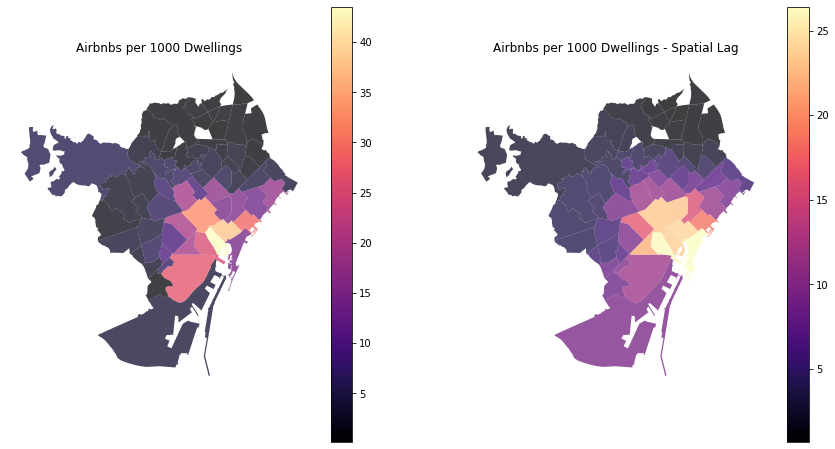

In [36]:
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(15, 8))

# two subplots produces ax[0] (left) and ax[1] (right)

# regular count map on the left
ab_barri.plot(ax=ax[0], # this assigns the map to the left subplot
         column='bnb16_per_1000', 
         cmap='magma', 
         #scheme='user_defined', 
         #classification_kwds={'bins':[0,5,10,15,20,25,30,35,40,45]},
         #scheme='quantiles',
         #k=5, 
         edgecolor='white',
         #legend = True,
         legend = True,
         #legend_kwds={'loc':"upper right", 'bbox_to_anchor':(3.0, 1.0), 'title':"Legend\n", 'frameon':False},
         linewidth=0, 
         alpha=0.75, 
           )


ax[0].axis("off")
ax[0].set_title("Airbnbs per 1000 Dwellings")

# spatial lag map on the right
ab_barri.plot(ax=ax[1], # this assigns the map to the right subplot
         column='bnb16_per_1000_lag', 
         cmap='magma',
         #scheme='user_defined', 
         #classification_kwds={'bins':[0,5,10,15,20,25,30,35,40,45]},
         #scheme='quantiles',
         #k=5, 
         legend = True,
         edgecolor='white', 
         linewidth=0, 
         alpha=0.75
           )

ax[1].axis("off")
ax[1].set_title("Airbnbs per 1000 Dwellings - Spatial Lag")

plt.show()

The first plot shows a concentration of higher airbnb counts in neighborhoods along the coast. The second plot shows high spatial lags in these same neighborhoods, and their neighboring neighborhoods. 

NOTE: Need to figure out if we can keep a consistent color scheme between multiple plots for comparison. 

### Moran's Plot

We want to see if the clusters shown in the map above are statistically significant. We'll do this for 2016 and 2019 data to compare. 

In [37]:
y16 = ab_barri.bnb16_per_1000
moran = Moran(y16, wq)
# calculate local moran values
lisa16 = esda.moran.Moran_Local(y16, wq)
moran.I

0.6153553723627463

In [38]:
y19 = ab_barri.bnb19_per_1000
moran = Moran(y19, wq)
lisa19 = esda.moran.Moran_Local(y19, wq)
moran.I

0.6168026633490956

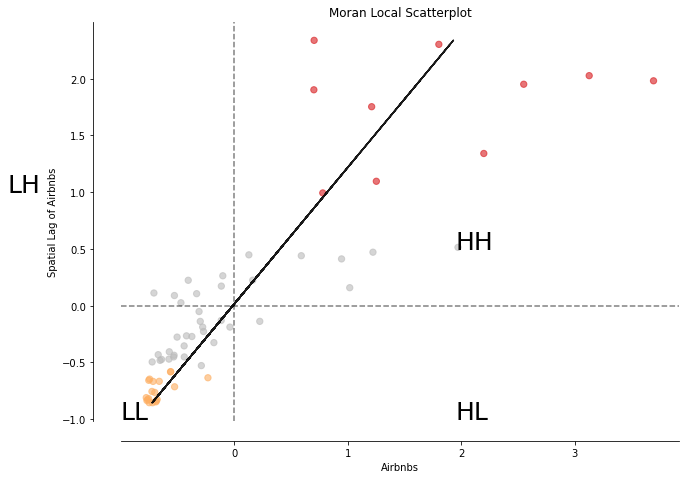

In [39]:
# Plot HH, LH, HL, and LL values within the Moran Local Scatterplot
fig,ax = plt.subplots(figsize=(10,15))

moran_scatterplot(lisa16, ax=ax, p=0.05) # alpha value 0.05
ax.set_xlabel("Airbnbs")
ax.set_ylabel('Spatial Lag of Airbnbs')

# add some labels
plt.text(1.95, 0.5, "HH", fontsize=25)
plt.text(1.95, -1, "HL", fontsize=25)
plt.text(-2, 1, "LH", fontsize=25)
plt.text(-1, -1, "LL", fontsize=25)
plt.show()

Looks like our data is clustered in the HH and LL categories. Therefore, we only have neighborhoods with high airbnb counts surrounded by other neighborhoods with high airbnb counts OR neighborhoods with low airbnb counts surrounded by other neighborhoods with low airbnb counts. 

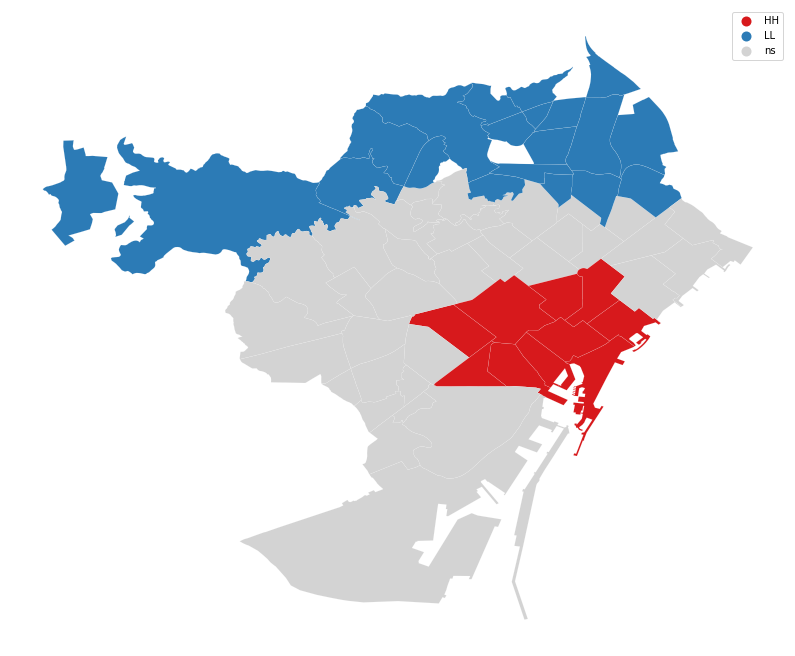

In [40]:
# Plot the 2016 data as spatial autocorrelation 
fig, ax = plt.subplots(figsize=(14,14))
lisa_cluster(lisa16, ab_barri, p=0.05, ax=ax)
plt.show()

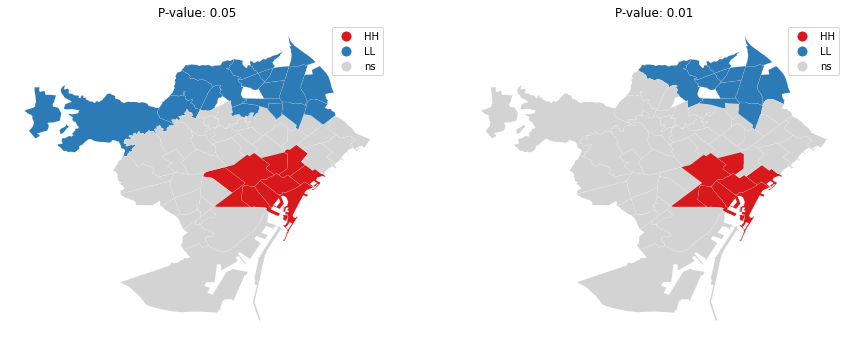

In [41]:
#create subplots to show 2016 airbnb data at alpha levels of 0.05
# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(15, 8))

# regular count map on the left
lisa_cluster(lisa16, ab_barri, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

# spatial lag map on the right
lisa_cluster(lisa16, ab_barri, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

plt.show()

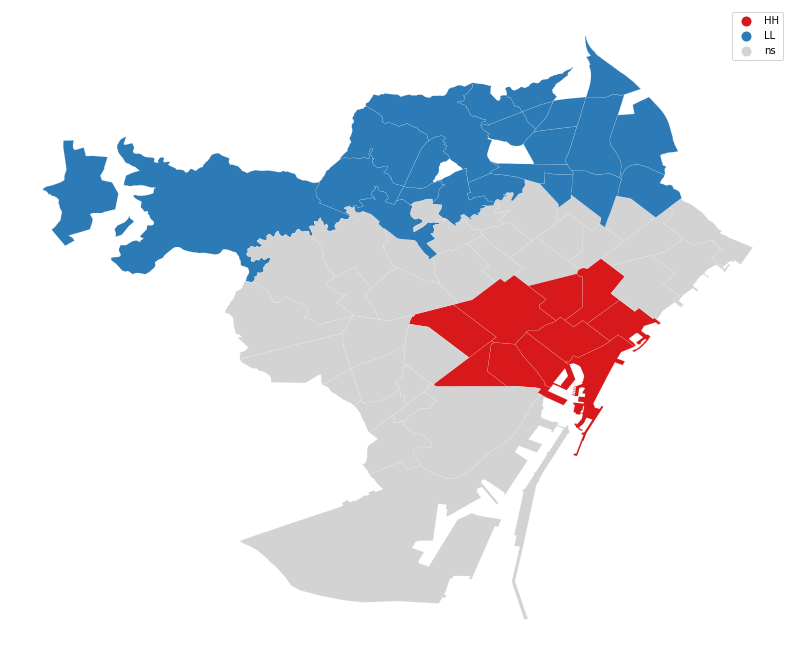

In [42]:
#Do the same for 2019 data
fig, ax = plt.subplots(figsize=(14,14))
lisa_cluster(lisa19, ab_barri, p=0.05, ax=ax)
plt.show()

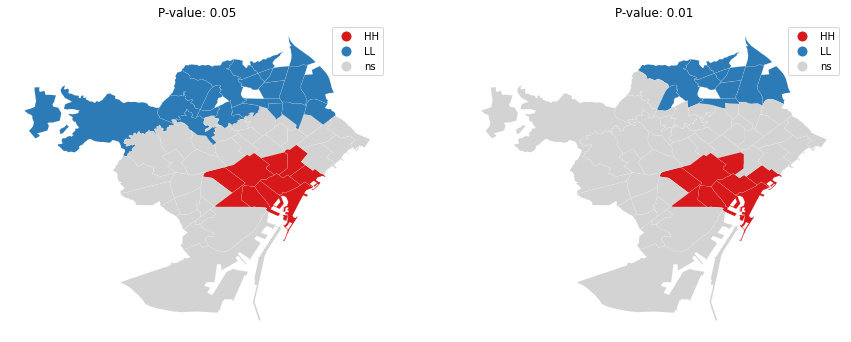

In [43]:
# Do the same for 2019 data

# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(15, 8))

# regular count map on the left
lisa_cluster(lisa19, ab_barri, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("P-value: 0.05")

# spatial lag map on the right
lisa_cluster(lisa19, ab_barri, p=0.01, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("P-value: 0.01")

plt.show()

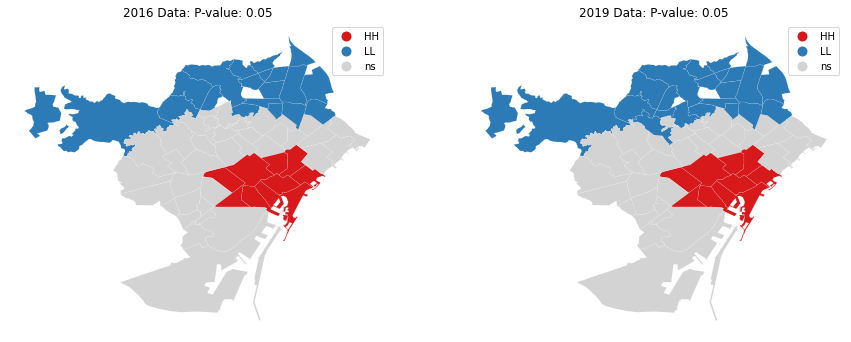

In [44]:
#Plot a comparison of 2016 and 2019 data. 

# create the 1x2 subplots
fig, ax = plt.subplots(1, 2, figsize=(15, 8))

# regular count map on the left
lisa_cluster(lisa16, ab_barri, p=0.05, ax=ax[0])

ax[0].axis("off")
ax[0].set_title("2016 Data: P-value: 0.05")

# spatial lag map on the right
lisa_cluster(lisa19, ab_barri, p=0.05, ax=ax[1])
ax[1].axis("off")
ax[1].set_title("2019 Data: P-value: 0.05")

plt.show()

These maps show a comparison between 2016 and 2019 spatial autocorrelations at an alpha level of 0.05. In 2019, we see four additional neighborhoods in the low-low category, meaning that either the airbnb counts within these neighborhoods have decreased, and/or counts within their neighborhing neighborhoods have decreased. 

We don't get a whole lot from these maps, except that the airbnb data is highly clustered in one area of the city. 

## Create Exploratory Maps

This section includes additional map exploration outside of the spatial autocorrelation. 

In [45]:
#bb_n = bb.set_index('n_barri')
df = ab_barri

fig = px.choropleth_mapbox(df, geojson=df.geometry, color="bnb19_per_1000",
                           color_continuous_scale="Viridis",
                           locations=df.index, #featureidkey='n_barri',
                           labels={'n_barri':"Barri "},
                           center={"lat": 41.3851, "lon": 2.1734},
                           mapbox_style="carto-positron", zoom=10)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
#fig.write_html("Barri Map with Background.html")
#plt.savefig('Barri Map with Background.png',bbox_inches='tight')
fig.show()

,id,neighbourhood,room_type,geometry
0,8665980,el Raval,Entire home/apt,POINT (2.17476 41.37698)
1,732616,el Raval,Entire home/apt,POINT (2.16546 41.38471)
3,2284413,el Raval,Entire home/apt,POINT (2.17340 41.38017)
5,10205997,el Raval,Entire home/apt,POINT (2.17586 41.37782)
7,10079400,el Raval,Entire home/apt,POINT (2.16846 41.37943)


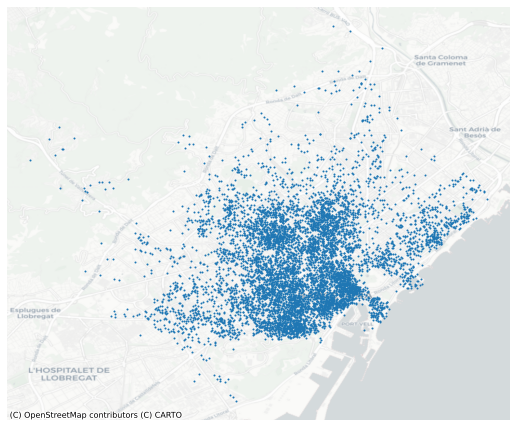

In [46]:
# Create a map of the points for Entire home/apt for 2016 data
# table
display(ab_16_pt[ab_16_pt.room_type == 'Entire home/apt'].head()) 

# map
ax = ab_16_pt[ab_16_pt.room_type == 'Entire home/apt'].plot(figsize=(9,9), markersize=1)

# axis
ax.axis('off')

# basemap
ctx.add_basemap(ax,
                crs='epsg:4326', # surprise! You can change the crs here!
                source=ctx.providers.CartoDB.Positron)

In [47]:
#df = ab2016_tr[ab2016_tr.room_type == 'Entire home/apt']

df = ab_19_pt

fig = px.scatter_mapbox(df,
                        lat=df.geometry.y,
                        lon=df.geometry.x,
                        mapbox_style="carto-positron",
                        color= 'neighbourhood',
                        zoom=10
                       )
fig.show()

In [48]:
#import plotly.express as px
#df = px.data.gapminder()

df = ab_16_pt
fig = px.scatter_mapbox(df,
                        lat=df.geometry.y,
                        lon=df.geometry.x,
                        mapbox_style="carto-positron",
                        color= 'room_type',
                        animation_frame='neighbourhood',
                        zoom=10)
fig.show()

In [49]:
ab_barri_n = ab_barri.set_index('n_barri_x')

fig = px.choropleth_mapbox(ab_barri_n, geojson=ab_barri_n.geometry, color="bnb19_per_1000",
                           color_continuous_scale="Viridis",
                           locations=ab_barri_n.index, #featureidkey='n_barri',
                           labels={'n_barri':"Barri "},
                           center={"lat": 41.3851, "lon": 2.1734},
                           mapbox_style="carto-positron", zoom=10)
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
#fig.write_html("Barri Map with Background.html")
#plt.savefig('Barri Map with Background.png',bbox_inches='tight')
fig.show()

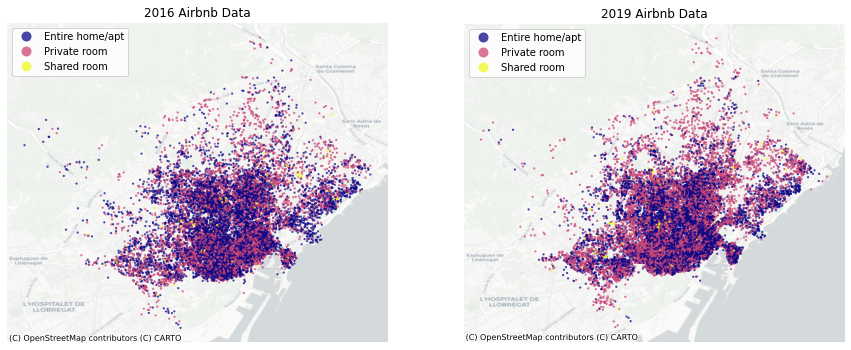

In [50]:
# create the 1x2 subplots; figure, axis; subplot with 1 row, 2 plots in row 
fig, axs = plt.subplots(1, 2, figsize=(15, 12))
# name each subplot
ax1, ax2 = axs

# map on the left
df1 = ab_16
df1.plot(column='room_type', 
            cmap='plasma', # color choice 
            edgecolor='white', 
            markersize=5,
            linewidth=0., 
            alpha=0.75, 
            ax=ax1, # this assigns the map to the subplot,
            legend=True)

ax1.axis("off") # turns off x and y axis numbers 
ax1.set_title("2016 Airbnb Data") # add a title to ax1
ctx.add_basemap(ax1,
                crs='epsg:4326', # surprise! You can change the crs here!
                source=ctx.providers.CartoDB.Positron)

# map on the right
df2 = ab_19
df2.plot(column='room_type', 
            cmap='plasma', # color choice 
            edgecolor='white',
            markersize=5,
            linewidth=0., 
            alpha=0.75, 
            ax=ax2, # this assigns the map to the subplot,
            legend=True)

ax2.axis("off")
ax2.set_title("2019 Airbnb Data")
ctx.add_basemap(ax2,
                crs='epsg:4326', # surprise! You can change the crs here!
                source=ctx.providers.CartoDB.Positron)

## Explore Data for Hosts with Multiple Properties

Keeping this here, in case we want to explore this later.

In [52]:
hostnum = ab_16.host_id.value_counts()
hostnum

396363      68
136853      51
10704       51
1391607     47
39506137    45
            ..
40256509     1
6975574      1
9000683      1
20886591     1
1404329      1
Name: host_id, Length: 8598, dtype: int64

In [53]:
host = ab_16.query("host_id == '396363'")
host1 = ab_16.query("host_id == '10704'")
host

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,geometry
1958,110098,Gignàs Gotic Area Old Town City,396363,Oscar And Diego,Ciutat Vella,el Barri Gòtic,41.38044712765650,2.1792852211714800,Entire home/apt,90,2,3,2013-05-31,0.06,68,257,POINT (2.17929 41.38045)
2263,953280,Barcelona Paseo San Juan Verdaguer,396363,Oscar And Diego,Eixample,la Dreta de l'Eixample,41.40025317617470,2.1667430261426400,Entire home/apt,146,2,0,,,68,334,POINT (2.16674 41.40025)
2654,83403,La Pedrera Paseo de Gracia I,396363,Oscar And Diego,Eixample,la Dreta de l'Eixample,41.395339964626200,2.164757940053530,Entire home/apt,146,2,2,2015-05-15,0.04,68,298,POINT (2.16476 41.39534)
3059,4924675,Provença Apartment near Sagrada,396363,Oscar And Diego,Eixample,la Dreta de l'Eixample,41.4001475444687,2.1692253278792600,Entire home/apt,64,2,3,2015-06-23,0.37,68,274,POINT (2.16923 41.40015)
3097,630810,Paseo de Gracia 5 Estrellas · 11 ·,396363,Oscar And Diego,Eixample,la Dreta de l'Eixample,41.39553828001920,2.1641932079130400,Entire home/apt,159,2,21,2015-11-27,0.57,68,341,POINT (2.16419 41.39554)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14352,3247256,Near Sagrada Familia Encants G51,396363,Oscar And Diego,Sant Martí,el Camp de l'Arpa del Clot,41.40792539137600,2.1809860939204800,Entire home/apt,64,2,0,,,68,252,POINT (2.18099 41.40793)
14357,1443842,Near Sagrada Familia Encants P4,396363,Oscar And Diego,Sant Martí,el Camp de l'Arpa del Clot,41.40817771690760,2.1809512555690700,Entire home/apt,90,2,1,2015-02-24,0.10,68,340,POINT (2.18095 41.40818)
14359,2159596,Rogent Terrace Near Sagrada Familia,396363,Oscar And Diego,Sant Martí,el Camp de l'Arpa del Clot,41.41055402366050,2.182705198303380,Entire home/apt,66,2,0,,,68,347,POINT (2.18271 41.41055)
14421,4924548,24·Encants New,396363,Oscar And Diego,Sant Martí,el Camp de l'Arpa del Clot,41.40856612349190,2.180950276306800,Entire home/apt,78,2,0,,,68,253,POINT (2.18095 41.40857)


In [54]:
ab_16_1 = ab_16.query("calculated_host_listings_count == '1'")
ab_16_2 = ab_16.query("calculated_host_listings_count != '1'")

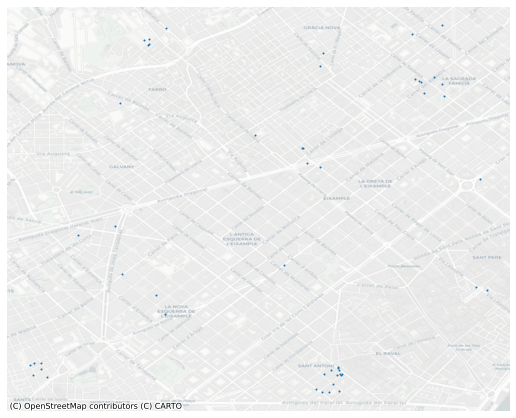

In [55]:
# map
ax = host1.plot(figsize=(9,9), markersize=1)

# axis
ax.axis('off')

ctx.add_basemap(ax,
                crs='epsg:4326', # surprise! You can change the crs here!
                source=ctx.providers.CartoDB.Positron)

## End of file

This notebook file explores point airbnb data, performs a spatial autocorrelation, and creates additional maps of the point and grouped airbnb data. 

Division of Work: We worked together to explore and clean the airbnb data. Tiffany collected total housing data per neighborhood and per year, and brought that in to combine it with the airbnb data. Casey created some exploratory maps with the airbnb data, using interactive features to be refined later. We shared responsiblity in running through the spatial autocorrelation commands. 